# Geographical Graph Construction

by Nan BAI

## Import Packages

In [1]:
import networkx as nx
import osmnx as ox
import pandas as pd
import numpy as np

ox.config(use_cache=True, log_console=True)

C:\Users\zzbn1\anaconda3\envs\ox\lib\site-packages\pyproj\__init__.py:91: UserWarning: Valid PROJ data directory not found. Either set the path using the environmental variable PROJ_LIB or with `pyproj.datadir.set_data_dir`.
  warnings.warn(str(err))


In [3]:
!conda list

# packages in environment at C:\Users\zzbn1\anaconda3:
#
# Name                    Version                   Build  Channel
_ipyw_jlab_nb_ext_conf    0.1.0                    py38_0  
absl-py                   1.0.0                    pypi_0    pypi
anaconda-client           1.9.0            py38haa95532_0  
anaconda-navigator        2.1.1                    py38_0  
anyio                     2.2.0            py38haa95532_2  
argon2-cffi               20.1.0           py38h2bbff1b_1  
astunparse                1.6.3                    pypi_0    pypi
async_generator           1.10               pyhd3eb1b0_0  
attrs                     21.4.0             pyhd3eb1b0_0  
babel                     2.9.1              pyhd3eb1b0_0  
backcall                  0.2.0              pyhd3eb1b0_0  
backports                 1.1                pyhd3eb1b0_0  
backports.functools_lru_cache 1.6.4              pyhd3eb1b0_0  
backports.tempfile        1.0                pyhd3eb1b0_1  
backports.weakref   

In [47]:
# download street network data from OSM and construct a MultiDiGraph model
G = ox.graph_from_point((52.365, 4.887777778), dist=2000, network_type="all")

In [70]:
# download street network data from OSM of Venice and construct a MultiDiGraph model
G = ox.graph_from_point((45.438759, 12.327145), dist=5000, network_type="all",simplify=True)

In [453]:
# download street network data from OSM of Amsterdam and construct a MultiDiGraph model
G = ox.graph_from_point((52.365, 4.887777778), dist=2000, network_type="all",simplify=True)

In [503]:
# download street network data from OSM of Suzhou and construct a MultiDiGraph model
G = ox.graph_from_point((31.302300, 120.631300), dist=5000, network_type="all",simplify=True)

In [504]:
# impute edge (driving) speeds and calculate edge traversal times
G = ox.add_edge_speeds(G)
G = ox.add_edge_travel_times(G)

In [505]:
# you can convert MultiDiGraph to/from geopandas GeoDataFrames
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
G = ox.graph_from_gdfs(gdf_nodes, gdf_edges, graph_attrs=G.graph)

In [506]:
# convert MultiDiGraph to DiGraph to use nx.betweenness_centrality function
# choose between parallel edges by minimizing travel_time attribute value
D = ox.utils_graph.get_digraph(G, weight="travel_time")

In [507]:
# calculate node betweenness centrality, weighted by travel time
bc = nx.betweenness_centrality(D, weight="travel_time", normalized=True)
nx.set_node_attributes(G, values=bc, name="bc")

In [508]:
# calculate node pagerank, weighted by travel time
pr = nx.pagerank(D, weight="travel_time")
nx.set_node_attributes(G, values=pr, name="pr")

In [509]:
# calculate node degree centrality
dg = nx.degree_centrality(D)
nx.set_node_attributes(G, values=dg, name="dg")

In [510]:
# calculate node closeness centrality, weighted by travel time
cl = nx.closeness_centrality(D, distance="travel_time")
nx.set_node_attributes(G, values=cl, name="cl")

In [511]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [512]:
G.graph

{'created_date': '2022-02-24 10:37:01',
 'created_with': 'OSMnx 1.1.2',
 'crs': 'epsg:4326',
 'simplified': True}

In [513]:
gdf_nodes

,y,x,street_count,bc,pr,dg,cl,highway,ref,geometry
osmid,,,,,,,,,,
265589093,31.323382,120.665262,4,0.056608,0.000088,0.000552,0.003434,NaN,NaN,POINT (120.66526 31.32338)
8359057968,31.323263,120.665289,4,0.013852,0.000154,0.000552,0.003422,crossing,NaN,POINT (120.66529 31.32326)
4603625084,31.323385,120.665417,4,0.057786,0.000055,0.000552,0.003429,NaN,NaN,POINT (120.66542 31.32338)
265596541,31.335519,120.613620,4,0.002719,0.000141,0.000829,0.003013,NaN,NaN,POINT (120.61362 31.33552)
5863201788,31.335384,120.613687,4,0.002523,0.000165,0.000829,0.003025,NaN,NaN,POINT (120.61369 31.33538)
...,...,...,...,...,...,...,...,...,...,...
9250213634,31.345813,120.645164,3,0.000087,0.000057,0.000276,0.001460,NaN,NaN,POINT (120.64516 31.34581)
8617095512,31.347170,120.633701,3,0.000000,0.000108,0.000138,0.002837,NaN,NaN,POINT (120.63370 31.34717)
9250213609,31.345122,120.647846,3,0.001047,0.000144,0.000414,0.002387,NaN,NaN,POINT (120.64785 31.34512)


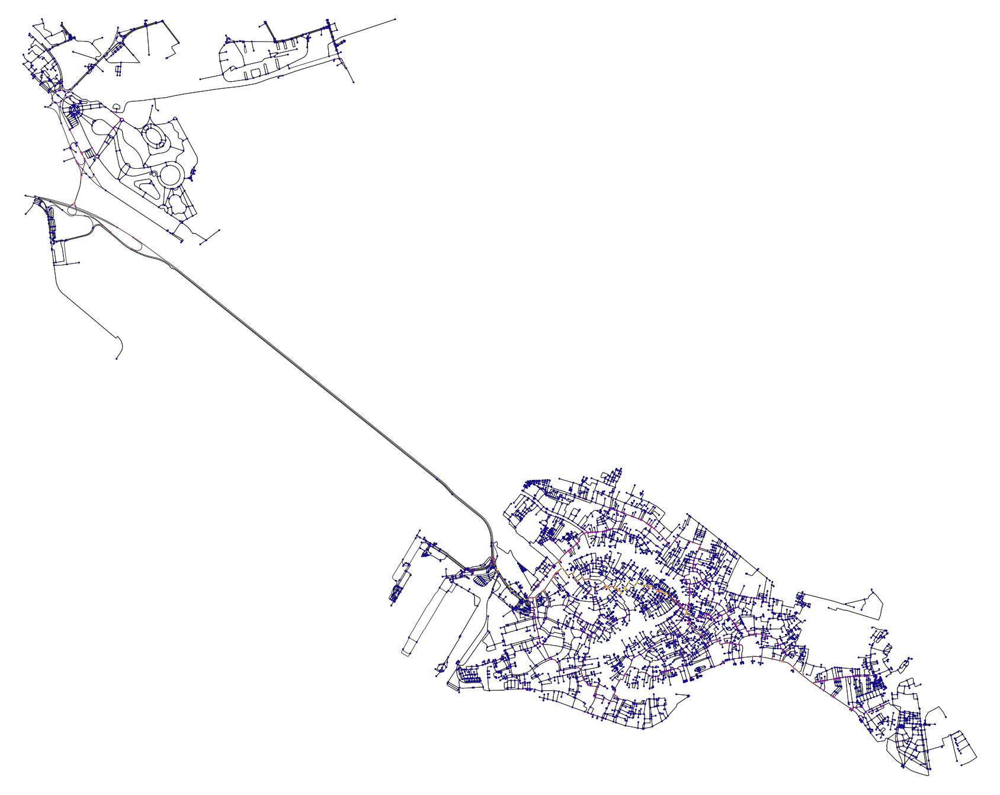

In [397]:
# plot the graph, coloring nodes by betweenness centrality
nc = ox.plot.get_node_colors_by_attr(G, "bc", cmap="plasma")
fig, ax = ox.plot_graph(
    G, bgcolor="w", node_color=nc, node_size=10, edge_linewidth=1, edge_color="#333333", figsize=(30,30)
)

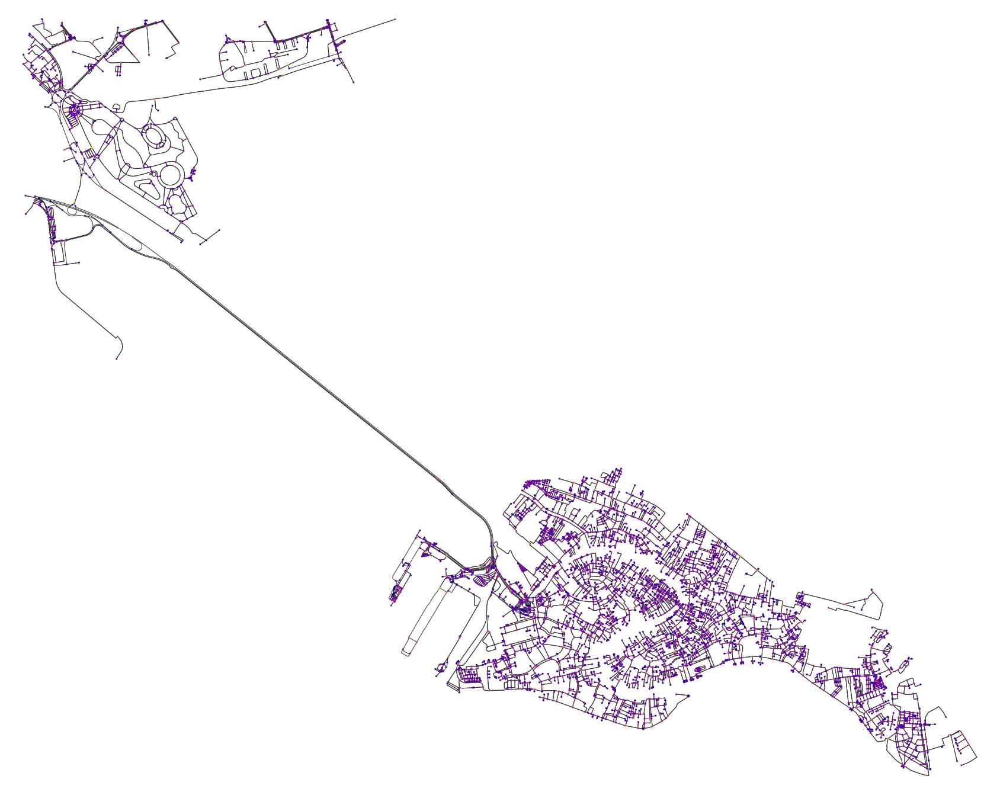

In [77]:
# plot the graph, coloring nodes by betweenness centrality
nc = ox.plot.get_node_colors_by_attr(G, "pr", cmap="plasma")
fig, ax = ox.plot_graph(
    G, bgcolor="w", node_color=nc, node_size=10, edge_linewidth=1, edge_color="#333333",figsize=(30,30)
)

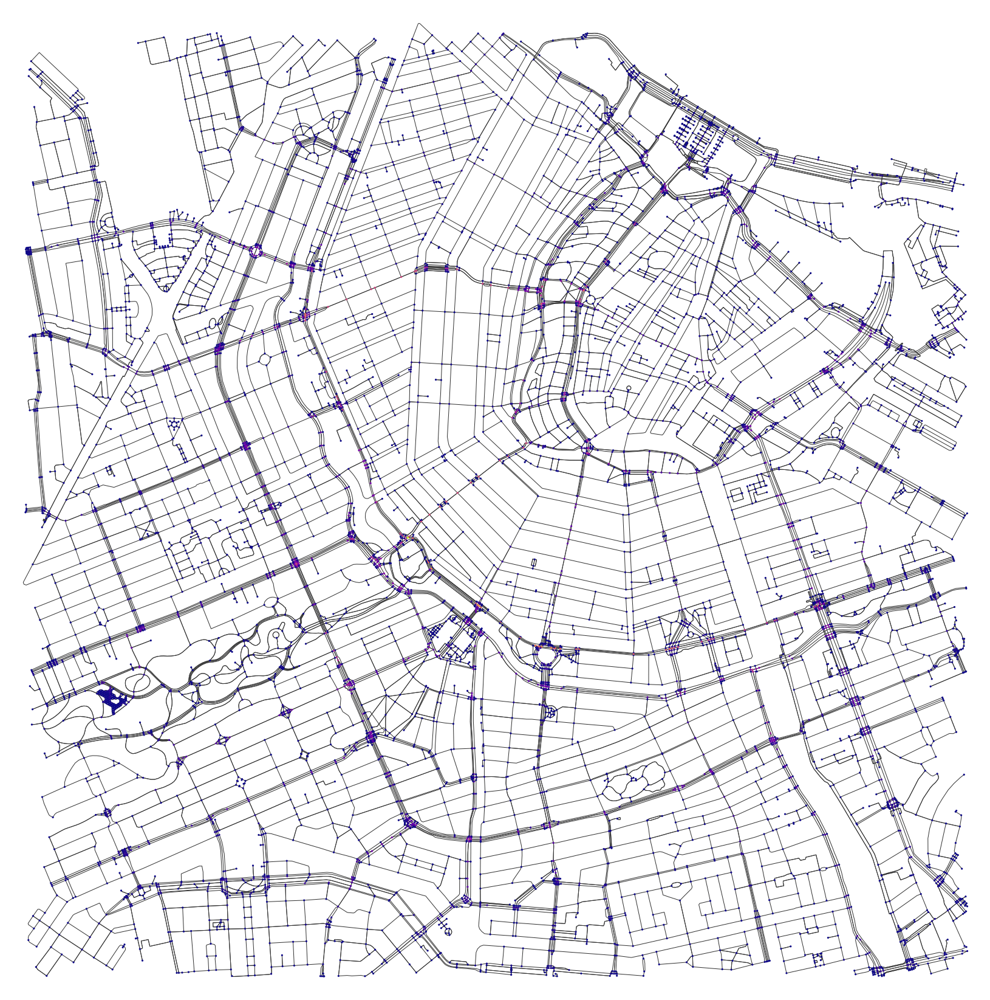

In [464]:
# plot the graph, coloring nodes by betweenness centrality
nc = ox.plot.get_node_colors_by_attr(G, "bc", cmap="plasma")
fig, ax = ox.plot_graph(
    G, bgcolor="w", node_color=nc, node_size=10, edge_linewidth=1, edge_color="#333333", figsize=(30,30)
)

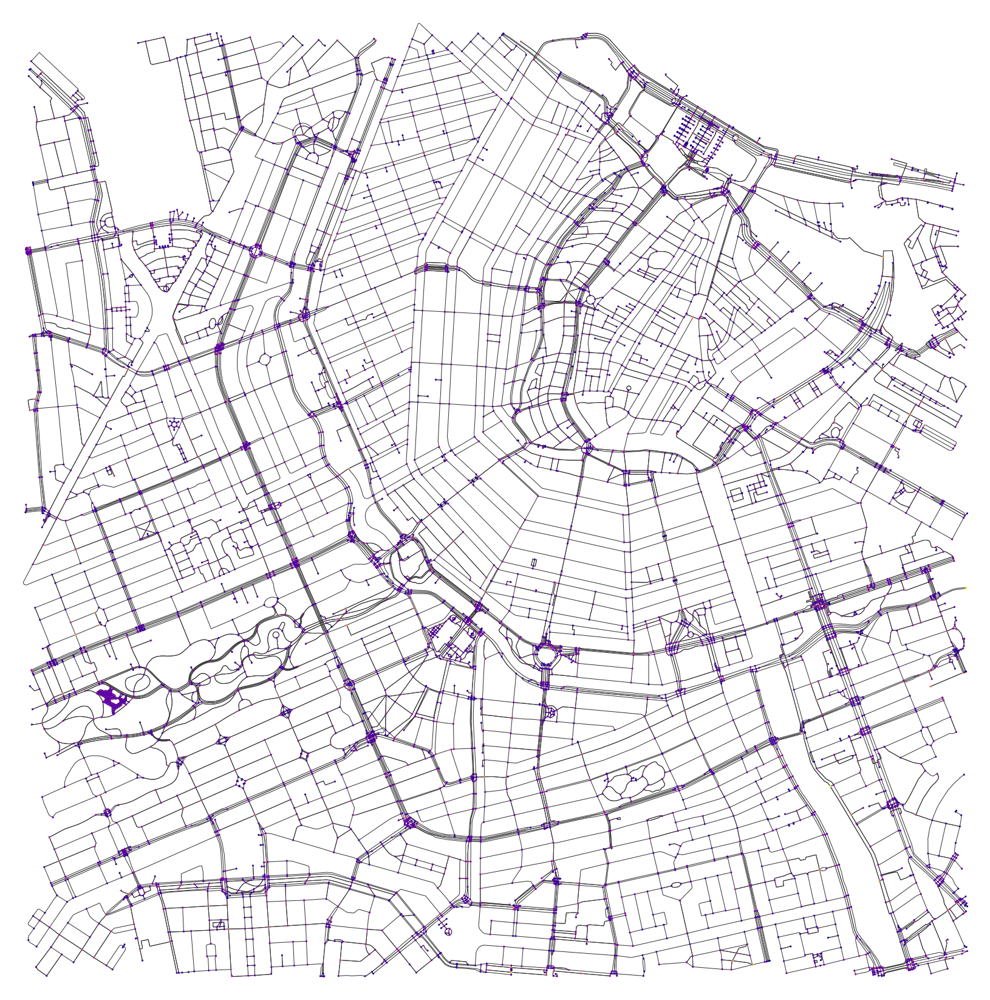

In [465]:
# plot the graph, coloring nodes by betweenness centrality
nc = ox.plot.get_node_colors_by_attr(G, "pr", cmap="plasma")
fig, ax = ox.plot_graph(
    G, bgcolor="w", node_color=nc, node_size=10, edge_linewidth=1, edge_color="#333333",figsize=(30,30)
)

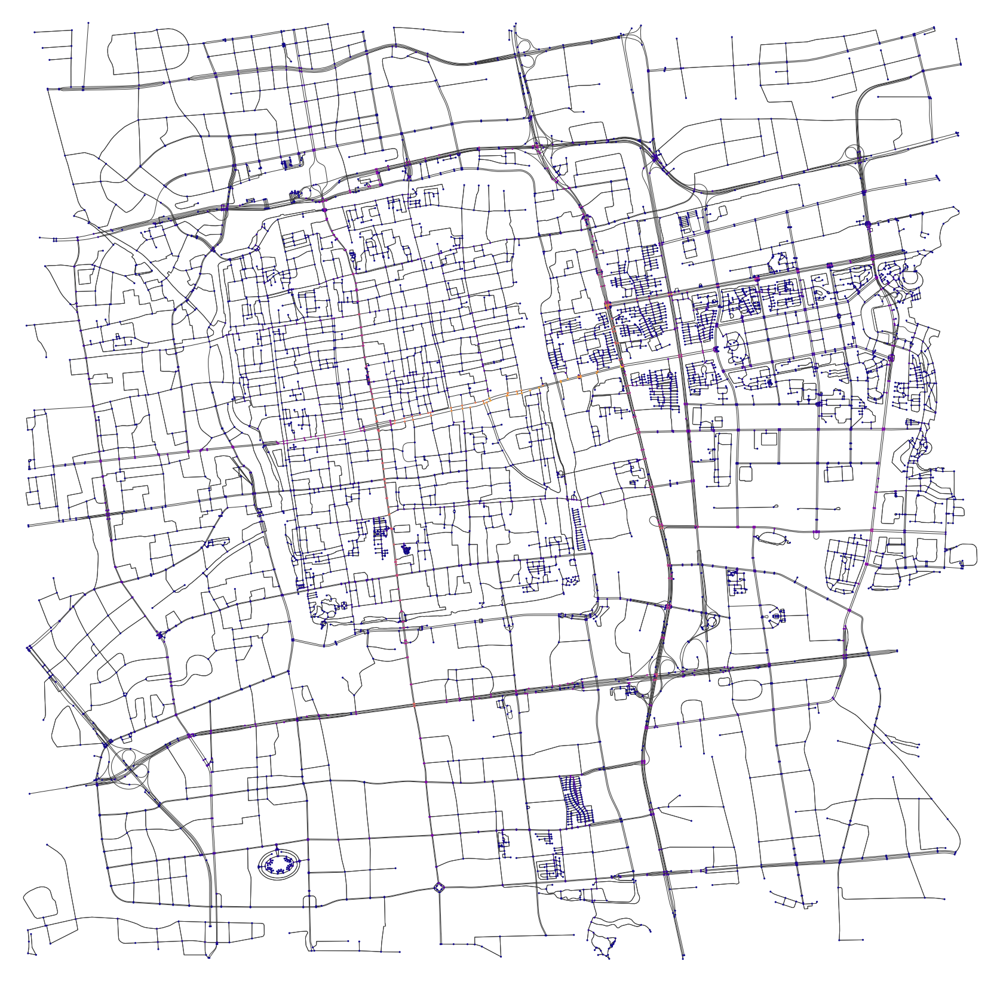

In [514]:
# plot the graph, coloring nodes by betweenness centrality
nc = ox.plot.get_node_colors_by_attr(G, "bc", cmap="plasma")
fig, ax = ox.plot_graph(
    G, bgcolor="w", node_color=nc, node_size=10, edge_linewidth=1, edge_color="#333333", figsize=(30,30)
)

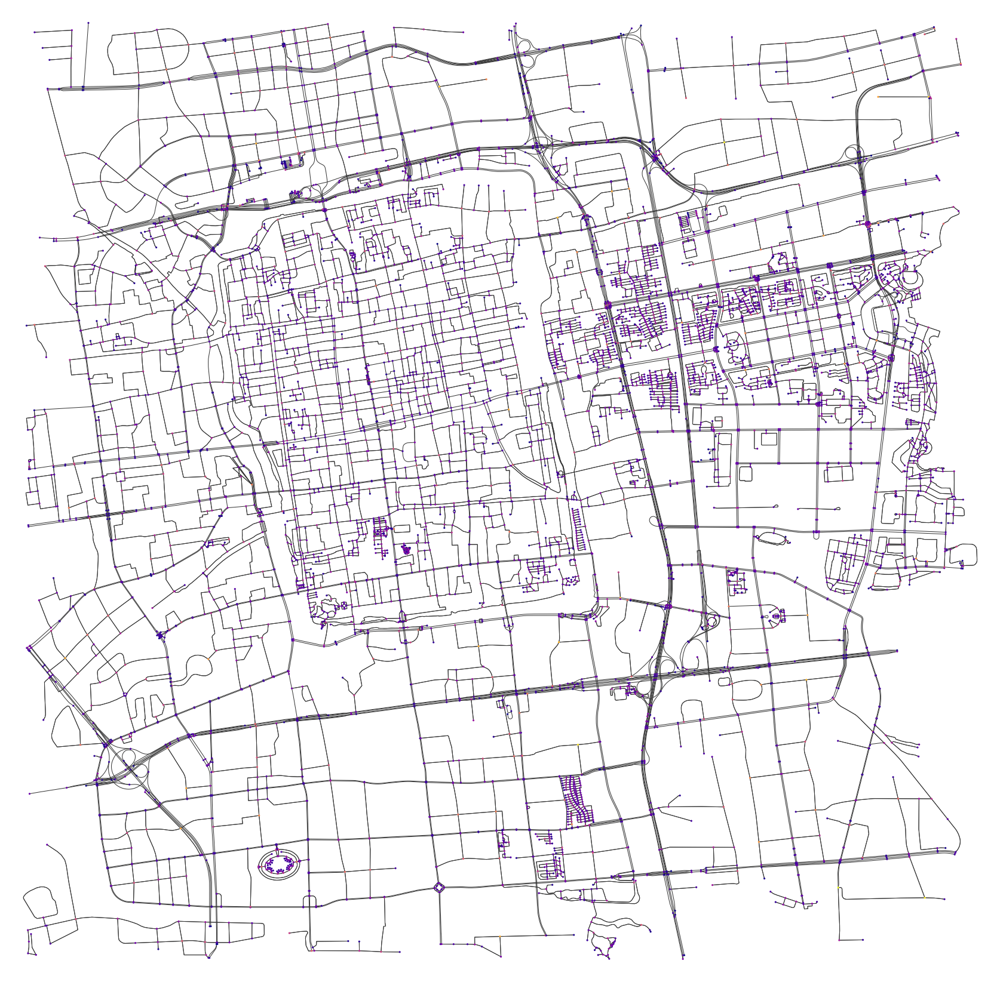

In [515]:
# plot the graph, coloring nodes by betweenness centrality
nc = ox.plot.get_node_colors_by_attr(G, "pr", cmap="plasma")
fig, ax = ox.plot_graph(
    G, bgcolor="w", node_color=nc, node_size=10, edge_linewidth=1, edge_color="#333333",figsize=(30,30)
)

In [516]:
gdf_nodes[~gdf_nodes['highway'].isnull()]

,y,x,street_count,bc,pr,dg,cl,highway,ref,geometry
osmid,,,,,,,,,,
8359057968,31.323263,120.665289,4,0.013852,0.000154,0.000552,0.003422,crossing,NaN,POINT (120.66529 31.32326)
265596549,31.340800,120.581197,4,0.001422,0.000205,0.000691,0.002069,traffic_signals,NaN,POINT (120.58120 31.34080)
265596759,31.303510,120.618990,4,0.088219,0.000064,0.000552,0.003771,traffic_signals,NaN,POINT (120.61899 31.30351)
4401976621,31.303488,120.618904,4,0.073163,0.000055,0.000552,0.003781,traffic_signals,NaN,POINT (120.61890 31.30349)
5085989509,31.324577,120.673619,4,0.043349,0.000044,0.000552,0.003110,traffic_signals,NaN,POINT (120.67362 31.32458)
...,...,...,...,...,...,...,...,...,...,...
8613327901,31.291188,120.650470,4,0.005690,0.000094,0.000829,0.003608,crossing,NaN,POINT (120.65047 31.29119)
8613327890,31.293986,120.651115,3,0.050726,0.000077,0.000552,0.003708,crossing,NaN,POINT (120.65112 31.29399)
8613327904,31.291435,120.650698,4,0.057907,0.000156,0.000829,0.003634,crossing,NaN,POINT (120.65070 31.29143)


In [129]:
size_df = pd.read_csv('Venezia/data_storage/metadata.csv',sep='\t').rename(columns={'Unnamed: 0':'index'})

In [409]:
size_df = pd.read_csv('data_storage/images/metadata.csv',sep='\t').rename(columns={'Unnamed: 0':'index'})

In [519]:
size_df = pd.read_csv('Amsterdam/data_storage/metadata.csv',sep='\t').rename(columns={'Unnamed: 0':'index'})

In [521]:
size_df = pd.read_csv('Suzhou/data_storage/metadata.csv',sep='\t').rename(columns={'Unnamed: 0':'index'})

In [522]:
size_df

,index,index,candownload,url_c,url_q,url_n,url_largest,owner,owner_loc,title,...,time,week,unique_week,Chinese,English,Other_Lang,num_sent,revised_text,text_data,text_len
0,8,51859675789,1.0,https://live.staticflickr.com/65535/5185967578...,https://live.staticflickr.com/65535/5185967578...,https://live.staticflickr.com/65535/5185967578...,https://live.staticflickr.com/65535/5185967578...,57210421@N04,"Beijing, China",灭渡桥,...,2022-02-03 13:33:40,5,202205,1.0,0.0,0.0,1.0,It has title of Extinction Bridge,. It has title ...,6.0
1,9,51859339946,1.0,https://live.staticflickr.com/65535/5185933994...,https://live.staticflickr.com/65535/5185933994...,https://live.staticflickr.com/65535/5185933994...,https://live.staticflickr.com/65535/5185933994...,57210421@N04,"Beijing, China",灭渡桥,...,2022-02-03 13:34:07,5,202205,NaN,NaN,NaN,NaN,It has title of Extinction Bridge,. It has title ...,NaN
2,10,51858385807,1.0,https://live.staticflickr.com/65535/5185838580...,https://live.staticflickr.com/65535/5185838580...,https://live.staticflickr.com/65535/5185838580...,https://live.staticflickr.com/65535/5185838580...,57210421@N04,"Beijing, China",灭渡桥,...,2022-02-03 13:34:18,5,202205,NaN,NaN,NaN,NaN,It has title of Extinction Bridge,. It has title ...,NaN
3,11,51859339546,1.0,https://live.staticflickr.com/65535/5185933954...,https://live.staticflickr.com/65535/5185933954...,https://live.staticflickr.com/65535/5185933954...,https://live.staticflickr.com/65535/5185933954...,57210421@N04,"Beijing, China",灭渡桥,...,2022-02-03 13:34:52,5,202205,NaN,NaN,NaN,NaN,It has title of Extinction Bridge,. It has title ...,NaN
4,12,51858385377,1.0,https://live.staticflickr.com/65535/5185838537...,https://live.staticflickr.com/65535/5185838537...,https://live.staticflickr.com/65535/5185838537...,https://live.staticflickr.com/65535/5185838537...,57210421@N04,"Beijing, China",灭渡桥,...,2022-02-03 13:38:02,5,202205,NaN,NaN,NaN,NaN,It has title of Extinction Bridge,. It has title ...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3132,4225,38397950426,1.0,https://live.staticflickr.com/4582/38397950426...,https://live.staticflickr.com/4582/38397950426...,https://live.staticflickr.com/4582/38397950426...,https://live.staticflickr.com/4582/38397950426...,28571579@N03,NaN,20171112_IMG_0515,...,2017-11-12 19:33:08,45,201745,NaN,NaN,NaN,NaN,NaN,. It has title of 20171112_IMG_0515. It has ta...,NaN
3133,4226,38397948496,1.0,https://live.staticflickr.com/4517/38397948496...,https://live.staticflickr.com/4517/38397948496...,https://live.staticflickr.com/4517/38397948496...,https://live.staticflickr.com/4517/38397948496...,28571579@N03,NaN,20171112_IMG_0518,...,2017-11-12 19:33:52,45,201745,NaN,NaN,NaN,NaN,NaN,. It has title of 20171112_IMG_0518. It has ta...,NaN
3134,4227,38454117381,1.0,https://live.staticflickr.com/4552/38454117381...,https://live.staticflickr.com/4552/38454117381...,https://live.staticflickr.com/4552/38454117381...,https://live.staticflickr.com/4552/38454117381...,28571579@N03,NaN,20171112_IMG_0531,...,2017-11-12 19:40:39,45,201745,NaN,NaN,NaN,NaN,NaN,. It has title of 20171112_IMG_0531. It has ta...,NaN
3135,4228,38397940256,1.0,https://live.staticflickr.com/4576/38397940256...,https://live.staticflickr.com/4576/38397940256...,https://live.staticflickr.com/4576/38397940256...,https://live.staticflickr.com/4576/38397940256...,28571579@N03,NaN,20171112_IMG_0539,...,2017-11-12 19:45:07,45,201745,NaN,NaN,NaN,NaN,NaN,. It has title of 20171112_IMG_0539. It has ta...,NaN


In [523]:
nearest_nodes = ox.distance.nearest_nodes(G, size_df['lon'].tolist(), size_df['lat'].tolist())

In [524]:
size_df['GEO_node'] = nearest_nodes

In [525]:
size_gdf = gdf_nodes.merge(size_df, how='right',right_on='GEO_node', left_index=True)

In [526]:
size_gdf.groupby('GEO_node').count()['x'].rename('posts_num')

GEO_node
265596548     36
265596549     64
265740334      2
266775136      1
266775144      2
              ..
9125534510     4
9131581520    10
9131581530    14
9131581533     3
9250213626     1
Name: posts_num, Length: 318, dtype: int64

In [527]:
size_gdf = size_gdf.merge(size_gdf.groupby('GEO_node').count()['x'].rename('posts_num'), how='left',left_on='GEO_node', right_index=True)

In [528]:
size_gdf

,y,x,street_count,bc,pr,dg,cl,highway,ref,geometry,...,unique_week,Chinese,English,Other_Lang,num_sent,revised_text,text_data,text_len,GEO_node,posts_num
0,31.290534,120.642004,3,0.002049,0.000075,0.000829,0.003205,NaN,NaN,POINT (120.64200 31.29053),...,202205,1.0,0.0,0.0,1.0,It has title of Extinction Bridge,. It has title ...,6.0,8017590880,18
1,31.290534,120.642004,3,0.002049,0.000075,0.000829,0.003205,NaN,NaN,POINT (120.64200 31.29053),...,202205,NaN,NaN,NaN,NaN,It has title of Extinction Bridge,. It has title ...,NaN,8017590880,18
2,31.290534,120.642004,3,0.002049,0.000075,0.000829,0.003205,NaN,NaN,POINT (120.64200 31.29053),...,202205,NaN,NaN,NaN,NaN,It has title of Extinction Bridge,. It has title ...,NaN,8017590880,18
3,31.290534,120.642004,3,0.002049,0.000075,0.000829,0.003205,NaN,NaN,POINT (120.64200 31.29053),...,202205,NaN,NaN,NaN,NaN,It has title of Extinction Bridge,. It has title ...,NaN,8017590880,18
4,31.290534,120.642004,3,0.002049,0.000075,0.000829,0.003205,NaN,NaN,POINT (120.64200 31.29053),...,202205,NaN,NaN,NaN,NaN,It has title of Extinction Bridge,. It has title ...,NaN,8017590880,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3132,31.319708,120.597708,3,0.000408,0.000107,0.000829,0.002600,NaN,NaN,POINT (120.59771 31.31971),...,201745,NaN,NaN,NaN,NaN,NaN,. It has title of 20171112_IMG_0515. It has ta...,NaN,7235832135,21
3133,31.319708,120.597708,3,0.000408,0.000107,0.000829,0.002600,NaN,NaN,POINT (120.59771 31.31971),...,201745,NaN,NaN,NaN,NaN,NaN,. It has title of 20171112_IMG_0518. It has ta...,NaN,7235832135,21
3134,31.319845,120.597866,3,0.002944,0.000108,0.000829,0.002607,NaN,NaN,POINT (120.59787 31.31984),...,201745,NaN,NaN,NaN,NaN,NaN,. It has title of 20171112_IMG_0531. It has ta...,NaN,7235832136,18
3135,31.320668,120.596940,3,0.002819,0.000065,0.000829,0.002592,NaN,NaN,POINT (120.59694 31.32067),...,201745,NaN,NaN,NaN,NaN,NaN,. It has title of 20171112_IMG_0539. It has ta...,NaN,8426347435,4


In [529]:
len(size_df['GEO_node'].unique())

318

In [530]:
agg_gdf = size_gdf.drop_duplicates('GEO_node')

<AxesSubplot:>

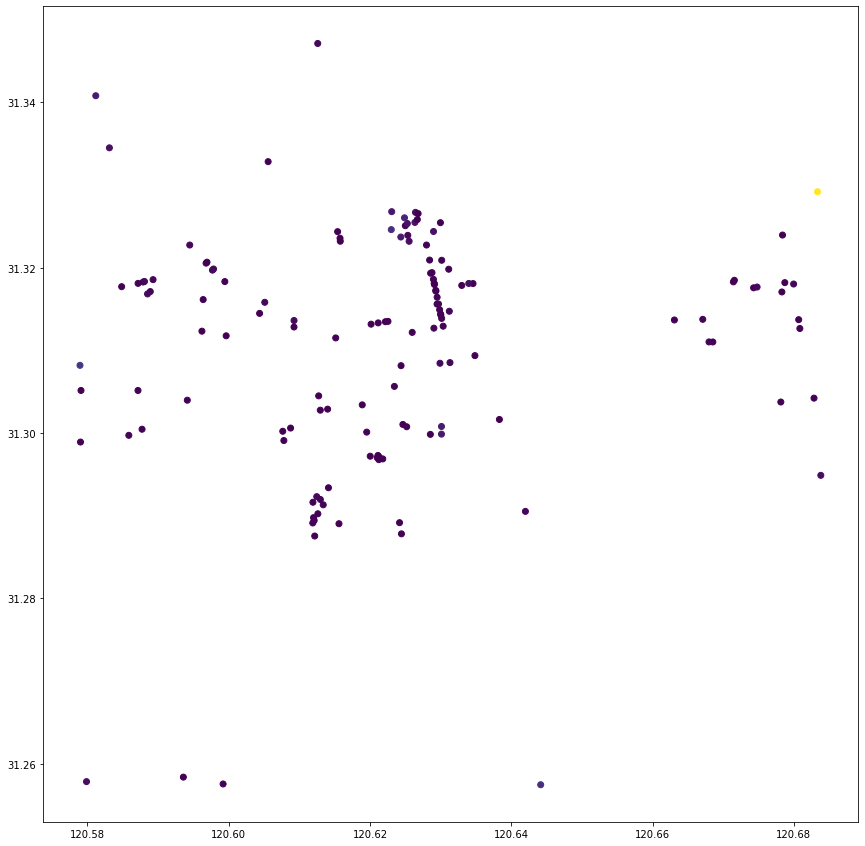

In [531]:
agg_gdf[agg_gdf['posts_num']>2].plot('posts_num',figsize=(15,15))

In [532]:
size_gdf.drop_duplicates('GEO_node')['posts_num'].value_counts()

1      121
2       57
3       25
4       20
6       12
8       10
5        9
7        8
9        4
12       4
11       3
10       3
14       3
32       3
64       2
24       2
13       2
17       2
18       2
21       2
25       2
19       2
44       1
136      1
34       1
55       1
23       1
16       1
58       1
41       1
65       1
15       1
29       1
36       1
113      1
39       1
114      1
27       1
20       1
92       1
828      1
22       1
Name: posts_num, dtype: int64

In [420]:
size_gdf.drop_duplicates('GEO_node')['posts_num'].value_counts()

1      676
2      463
3      319
4      231
5      178
      ... 
377      1
820      1
96       1
176      1
138      1
Name: posts_num, Length: 211, dtype: int64

In [489]:
agg_gdf['GEO_node']

0         46327539
1       1565648198
2       7038645211
3         46283525
5       2308965805
           ...    
3663      46292204
3665      46387771
3668    3274830379
3675      46363905
3682      46364719
Name: GEO_node, Length: 945, dtype: int64

In [479]:
distances = ox.distance.shortest_path(G, agg_gdf['GEO_node'].to_list()[0],agg_gdf['GEO_node'].to_list()[1])

In [480]:
len(distances)

50

In [533]:
p = dict(nx.shortest_path_length(G, weight = "travel_time"))

In [534]:
p_dict = {}
for a in list(p.keys()):
    p_dict[a] = {}
    for b in list(p.keys()):
        try:
            p_dict[a][b] = p[a][b]
        except:
            p_dict[a][b] = np.inf

In [535]:
dist_df_all = pd.DataFrame(p_dict)

In [536]:
dist_df = dist_df_all[agg_gdf['GEO_node']].loc[agg_gdf['GEO_node']]

In [537]:
dist_df.iloc[:,0].sort_values()

8017590880      0.0
8017630207      6.8
3762443494     15.6
8002330968    118.6
5197537092    128.4
              ...  
4855847727    625.9
1733883525    652.3
3618646382    707.0
9250213626      inf
4778548820      inf
Name: 8017590880, Length: 318, dtype: float64

In [446]:
dict(dist_df.iloc[:,0].iloc[dist_df.iloc[:,0].argsort().values[1:6]])

{1675825096: 0.4,
 764403528: 0.7,
 8670969688: 0.7,
 4982195157: 1.1,
 4982195159: 1.1}

In [449]:
agg_gdf['k-nearest'] = agg_gdf['GEO_node'].apply(lambda x: dist_df.index[dist_df.loc[x].argsort().values[1:10]].tolist())

KeyError: 49973409

In [226]:
agg_gdf['k-nearest_dists'] = agg_gdf['GEO_node'].apply(lambda x: dict(dist_df.loc[x].iloc[dist_df.loc[x].argsort().values[1:10]]))

C:\Users\zzbn1\anaconda3\envs\ox\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [447]:
agg_gdf

,y,x,street_count,pr,bc,dg,cl,highway,geometry,index,...,unique_week,English,Italian,Other_Lang,num_sent,revised_text,text_data,text_len,GEO_node,posts_num
0,45.435812,12.335472,1,0.000063,0.000000,0.000342,0.005654,NaN,POINT (12.33547 45.43581),6,...,201012,0.0,0.0,0.0,12.0,It has title of Venice - Minelli Palace Courty...,El palacio Contarini del Bovolo (también llama...,236.0,49973409,2
1,45.435643,12.335290,3,0.000246,0.021225,0.001026,0.005649,NaN,POINT (12.33529 45.43564),7,...,201012,0.0,0.0,0.0,12.0,It has title of Venice - Minelli Palace. It ha...,El palacio Contarini del Bovolo (también llama...,234.0,49981281,2
2,45.437798,12.336022,3,0.000126,0.000000,0.000684,0.005971,NaN,POINT (12.33602 45.43780),10,...,202033,0.0,0.0,0.0,6.0,"It has tags of canalgrande, canal, bridge, pie...",Canal Grande on Venetsian pääliikenneväylä. Ku...,84.0,5128847037,26
3,45.437500,12.334590,3,0.000245,0.001504,0.001026,0.005941,NaN,POINT (12.33459 45.43750),11,...,202033,0.0,0.0,0.0,4.0,"It has tags of pier, italy, venice, gondola, c...",Corona-rajoitusten aikaan oli hyvä tilaisuus k...,80.0,4370729275,42
4,45.437222,12.333909,3,0.000262,0.001188,0.001026,0.005937,NaN,POINT (12.33391 45.43722),12,...,202033,0.0,0.0,0.0,4.0,"It has tags of commercialbuildings, italy, ven...",Corona-rajoitusten aikaan oli hyvä tilaisuus k...,76.0,1840378053,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80690,45.442600,12.333538,1,0.000137,0.000000,0.000342,0.005116,NaN,POINT (12.33354 45.44260),116237,...,201734,NaN,NaN,NaN,NaN,NaN,. It has title of IMG_20170825_132006. It has ...,NaN,298026706,1
80751,45.444009,12.332236,1,0.000046,0.000000,0.000342,0.005174,NaN,POINT (12.33224 45.44401),116317,...,201641,0.0,0.0,0.0,2.0,It has title of Venetian life. It has tags of ...,. It has title of Venetian life. It has tags o...,16.0,5244439847,16
80794,45.441887,12.336708,1,0.000106,0.000000,0.000342,0.005305,NaN,POINT (12.33671 45.44189),116379,...,201529,0.0,0.0,0.0,2.0,"It has tags of venice, gondolier, bridge, sony...",Gondolier. It has title of Gondolier. It has t...,14.0,1765405927,1
80829,45.441670,12.337693,3,0.000212,0.075797,0.001026,0.005424,NaN,POINT (12.33769 45.44167),116428,...,201640,NaN,NaN,NaN,NaN,NaN,. It has title of IMG_20161009_102144. It has ...,NaN,27239504,1


In [263]:
a = dist_df.values.flatten()
a.sort()
len(a), len(a[a!=0])

(874225, 873290)

<AxesSubplot:>

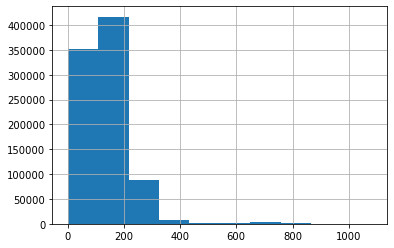

In [271]:
pd.Series(a[a!=0]).hist()

In [277]:
qt_v = []
for i in range(2,20):
    qt_v.append(pd.Series(a[a!=0]).quantile(1/i))

In [280]:
pd.Series(qt_v)

0     125.8
1      94.7
2      77.4
3      66.7
4      59.6
5      54.4
6      50.2
7      47.0
8      44.3
9      42.0
10     39.9
11     38.2
12     36.6
13     35.2
14     34.0
15     32.9
16     31.8
17     30.9
dtype: float64

In [538]:
dist_df

,8017590880,430312150,5121497166,5481977300,7535568662,7509106974,8127677025,1968285008,5171406201,4778548820,...,8105202258,4394822770,5096875946,5230353985,5011890168,7429680794,7848457933,4678184340,266775136,1614843285
8017590880,0.0,354.8,362.2,406.7,312.4,355.5,437.0,477.6,520.6,349.8,...,366.4,338.1,589.4,489.6,399.1,421.9,295.3,297.6,191.9,435.5
430312150,381.9,0.0,62.4,281.2,155.6,423.1,419.9,177.8,323.5,20.6,...,159.3,124.6,289.6,431.9,401.8,424.6,300.8,315.2,217.4,310.0
5121497166,347.1,124.8,0.0,246.4,220.3,456.1,433.2,115.4,261.1,145.4,...,224.0,189.3,227.2,445.2,434.8,448.3,339.9,342.2,205.3,275.2
5481977300,409.7,293.6,231.1,0.0,302.5,523.3,556.6,346.5,167.7,313.4,...,351.6,321.9,395.1,573.7,518.7,541.5,392.5,394.8,267.9,82.6
7535568662,352.0,155.6,218.0,303.1,0.0,411.8,445.1,333.4,417.0,150.6,...,90.8,62.5,445.2,462.2,407.2,430.0,281.0,283.3,200.5,331.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7429680794,452.9,395.8,458.2,515.0,408.9,141.0,15.1,522.0,628.9,389.0,...,441.8,407.1,597.1,189.3,25.2,0.0,210.6,213.6,412.4,543.8
7848457933,322.2,292.8,354.6,389.3,283.2,162.6,227.3,419.0,503.2,286.0,...,337.2,304.1,494.1,269.4,189.4,212.2,0.0,21.8,286.7,418.1
4678184340,334.8,307.2,367.2,401.9,295.8,140.8,221.1,433.4,515.8,300.4,...,349.8,318.5,508.5,272.4,183.2,206.0,21.8,0.0,299.3,430.7
266775136,250.6,209.1,214.2,258.7,207.9,428.7,462.0,329.6,372.6,228.9,...,257.0,227.3,441.4,479.1,424.1,446.9,297.9,300.2,0.0,287.5


In [283]:
dist_df.to_csv('Venezia/data_storage/GEO_node_dist.csv',sep='\t')

In [444]:
dist_df.to_csv('data_storage/images/GEO_node_dist.csv',sep='\t')

In [496]:
dist_df.to_csv('Amsterdam/data_storage/GEO_node_dist.csv',sep='\t')

In [497]:
dist_df_all.to_csv('Amsterdam/data_storage/GEO_node_dist_all.csv',sep='\t')

In [539]:
dist_df.to_csv('Suzhou/data_storage/GEO_node_dist.csv',sep='\t')

In [287]:
import fiona

In [288]:
fiona.supported_drivers

{'ARCGEN': 'r',
 'DXF': 'rw',
 'CSV': 'raw',
 'OpenFileGDB': 'r',
 'ESRIJSON': 'r',
 'ESRI Shapefile': 'raw',
 'FlatGeobuf': 'rw',
 'GeoJSON': 'raw',
 'GeoJSONSeq': 'rw',
 'GPKG': 'raw',
 'GML': 'rw',
 'OGR_GMT': 'rw',
 'GPX': 'rw',
 'GPSTrackMaker': 'rw',
 'Idrisi': 'r',
 'MapInfo File': 'raw',
 'DGN': 'raw',
 'PCIDSK': 'raw',
 'OGR_PDS': 'r',
 'S57': 'r',
 'SQLite': 'raw',
 'TopoJSON': 'r'}

In [293]:
size_gdf.columns

Index(['y', 'x', 'street_count', 'pr', 'bc', 'highway', 'geometry', 'index',
       'index', 'candownload', 'url_c', 'url_q', 'url_n', 'url_largest',
       'owner', 'owner_loc', 'title', 'description', 'comments', 'taken',
       'views', 'people', 'tags', 'lat', 'lon', 'neighbourhood', 'url',
       'local', 'tag_list', 'tag_len', 'NOT', 'year', 'time', 'week',
       'unique_week', 'English', 'Italian', 'Other_Lang', 'num_sent',
       'revised_text', 'text_data', 'text_len', 'GEO_node', 'posts_num'],
      dtype='object')

In [452]:
gdf_nodes

,y,x,street_count,pr,bc,dg,cl,highway,geometry
osmid,,,,,,,,,
27178184,45.438197,12.335686,4,0.000197,0.208517,0.001368,0.005999,NaN,POINT (12.33569 45.43820)
764403528,45.438128,12.335605,3,0.000175,0.025767,0.001026,0.005985,NaN,POINT (12.33561 45.43813)
1675825096,45.438233,12.335728,3,0.000186,0.048636,0.001026,0.005990,NaN,POINT (12.33573 45.43823)
8670969688,45.438255,12.335601,3,0.000111,0.207535,0.001026,0.005998,NaN,POINT (12.33560 45.43825)
5395065019,45.438053,12.335932,4,0.000236,0.196443,0.001368,0.006001,NaN,POINT (12.33593 45.43805)
...,...,...,...,...,...,...,...,...,...
9196476006,45.441902,12.307559,3,0.000119,0.000691,0.001026,0.004071,NaN,POINT (12.30756 45.44190)
9196521176,45.438670,12.326683,1,0.000077,0.000000,0.000342,0.005886,NaN,POINT (12.32668 45.43867)
9221655954,45.467211,12.279144,1,0.000030,0.000000,0.000342,0.001992,NaN,POINT (12.27914 45.46721)


In [406]:
size_gdf.to_csv('Venezia/data_storage/GEO_metadata.csv',sep='\t')

In [407]:
gdf_edges.to_csv('Venezia/data_storage/GEO_edges.csv',sep='\t')
gdf_nodes.to_csv('Venezia/data_storage/GEO_nodes.csv',sep='\t')

In [408]:
gdf_nodes.to_file('Venezia/data_storage/GEO_nodes.geojson')

In [451]:
size_gdf.to_csv('data_storage/images/GEO_metadata.csv',sep='\t')

In [407]:
gdf_edges.to_csv('data_storage/images/GEO_edges.csv',sep='\t')
gdf_nodes.to_csv('data_storage/images/GEO_nodes.csv',sep='\t')

In [498]:
size_gdf.to_csv('Amsterdam/data_storage/GEO_metadata.csv',sep='\t')

In [499]:
gdf_edges.to_csv('Amsterdam/data_storage/GEO_edges.csv',sep='\t')
gdf_nodes.to_csv('Amsterdam/data_storage/GEO_nodes.csv',sep='\t')

In [500]:
gdf_nodes.to_file('Amsterdam/data_storage/GEO_nodes.geojson')

In [540]:
size_gdf.to_csv('Suzhou/data_storage/GEO_metadata.csv',sep='\t')

In [541]:
gdf_edges.to_csv('Suzhou/data_storage/GEO_edges.csv',sep='\t')
gdf_nodes.to_csv('Suzhou/data_storage/GEO_nodes.csv',sep='\t')

In [542]:
gdf_nodes.to_file('Suzhou/data_storage/GEO_nodes.geojson')

In [379]:
gdf_nodes

,y,x,street_count,pr,bc,highway,geometry
osmid,,,,,,,
27178184,45.438197,12.335686,4,0.000197,0.208517,NaN,POINT (12.33569 45.43820)
764403528,45.438128,12.335605,3,0.000175,0.025767,NaN,POINT (12.33561 45.43813)
1675825096,45.438233,12.335728,3,0.000186,0.048636,NaN,POINT (12.33573 45.43823)
8670969688,45.438255,12.335601,3,0.000111,0.207535,NaN,POINT (12.33560 45.43825)
5395065019,45.438053,12.335932,4,0.000236,0.196443,NaN,POINT (12.33593 45.43805)
...,...,...,...,...,...,...,...
9196476006,45.441902,12.307559,3,0.000119,0.000691,NaN,POINT (12.30756 45.44190)
9196521176,45.438670,12.326683,1,0.000077,0.000000,NaN,POINT (12.32668 45.43867)
9221655954,45.467211,12.279144,1,0.000030,0.000000,NaN,POINT (12.27914 45.46721)


In [501]:
gdf_edges_save = gdf_edges.copy()
for ID in [gdf_edges.columns[n] for n in range(len(a)) if a[n]!=0]:
    gdf_edges_save[ID] = gdf_edges_save[ID].astype(str)

TypeError: object of type 'int' has no len()

In [502]:
gdf_edges_save

osmid  oneway  \
u          v          key                                                
6316199    1360288007 0                                4745774   False   
           46379627   0          [38297120, 7372610, 38297119]   False   
           46389218   0                                7372614    True   
1360288007 26605707   0                                4745774   False   
           1360288010 0                              121531339    True   
...                                                        ...     ...   
9447898761 9447862708 0    [1024598738, 1024598739, 112166358]   False   
           9447898763 0                             1024600817   False   
9447898763 9447898761 0                             1024600817   False   
9447898766 9447898764 0               [1024600818, 1024600819]   False   
9462911818 9462911824 0                             1026370300   False   

                                                                 name  \
u          v          key                                               
6316199    1360288007 0                                     Raamsteeg   
           46379627   0    [Oude Spiegelstraat, Joes Kloppenburgbrug]   
           46389218   0                                        Singel   
1360288007 26605707   0                                     Raamsteeg   
           1360288010 0                                           NaN   
...                                                               ...   
9447898761 9447862708 0                                           NaN   
           9447898763 0                                           NaN   
9447898763 9447898761 0                                           NaN   
9447898766 9447898764 0                                           NaN   
9462911818 9462911824 0                                           NaN   

                                    highway width   length  \
u          v          key                                    
6316199    1360288007 0            cycleway  1.80   42.398   
           46379627   0        unclassified   NaN   42.497   
           46389218   0         residential   NaN  225.577   
1360288007 26605707   0            cycleway  1.80    7.793   
           1360288010 0            cycleway  1.60   64.754   
...                                     ...   ...      ...   
9447898761 9447862708 0    [steps, footway]   NaN   13.732   
           9447898763 0             footway   NaN   23.988   
9447898763 9447898761 0             footway   NaN   23.988   
9447898766 9447898764 0    [steps, footway]   NaN    7.155   
9462911818 9462911824 0             footway   NaN   16.334   

                                                                    geometry  \
u          v          key                                                      
6316199    1360288007 0    LINESTRING (4.88840 52.37017, 4.88847 52.37017...   
           46379627   0    LINESTRING (4.88840 52.37017, 4.88827 52.37018...   
           46389218   0    LINESTRING (4.88840 52.37017, 4.88873 52.37195...   
1360288007 26605707   0      LINESTRING (4.88899 52.37028, 4.88909 52.37031)   
           1360288010 0      LINESTRING (4.88899 52.37028, 4.88883 52.36970)   
...                                                                      ...   
9447898761 9447862708 0    LINESTRING (4.85959 52.36437, 4.85961 52.36439...   
           9447898763 0    LINESTRING (4.85959 52.36437, 4.85963 52.36437...   
9447898763 9447898761 0    LINESTRING (4.85977 52.36454, 4.85963 52.36437...   
9447898766 9447898764 0    LINESTRING (4.85980 52.36457, 4.85986 52.36455...   
9462911818 9462911824 0    LINESTRING (4.89457 52.35448, 4.89464 52.35451...   

                           speed_kph  travel_time bridge maxspeed lanes  ref  \
u          v          key                                                      
6316199    1360288007 0         34.4          4.4    NaN      NaN   NaN  NaN   
           46379627   0         34.7          4.4    yes

In [364]:
gdf_edges[[gdf_edges.columns[n] for n in range(len(a)) if a[n]!=0]]

bridge  oneway  length  speed_kph  travel_time  \
u          v          key                                                  
27178184   764403528  0      yes   False   9.935       49.5          0.7   
           1675825096 0      yes   False   5.120       49.5          0.4   
           8670969688 0      yes   False   9.212       49.5          0.7   
           5395065019 0      yes   False  24.986       49.5          1.8   
764403528  27178184   0      yes   False   9.935       49.5          0.7   
...                          ...     ...     ...        ...          ...   
9196476006 9196476008 0      NaN   False  16.906       49.5          1.2   
9196521176 9196521177 0      NaN   False  20.186       49.5          1.5   
9221655954 9221655952 0      NaN   False   8.230       29.1          1.0   
9379177140 9379177139 0      NaN   False  16.390       49.5          1.2   
9439079311 9439079312 0      NaN   False  93.671       49.5          6.8   

                                                                    geometry  \
u          v          key                                                      
27178184   764403528  0    LINESTRING (12.33569 45.43820, 12.33561 45.43813)   
           1675825096 0    LINESTRING (12.33569 45.43820, 12.33573 45.43823)   
           8670969688 0    LINESTRING (12.33569 45.43820, 12.33560 45.43825)   
           5395065019 0    LINESTRING (12.33569 45.43820, 12.33590 45.438...   
764403528  27178184   0    LINESTRING (12.33561 45.43813, 12.33569 45.43820)   
...                                                                      ...   
9196476006 9196476008 0    LINESTRING (12.30756 45.44190, 12.30753 45.44205)   
9196521176 9196521177 0    LINESTRING (12.32668 45.43867, 12.32672 45.438...   
9221655954 9221655952 0    LINESTRING (12.27914 45.46721, 12.27911 45.467...   
9379177140 9379177139 0    LINESTRING (12.33103 45.43239, 12.33123 45.43235)   
9439079311 9439079312 0    LINESTRING (12.31727 45.44591, 12.31718 45.445...   

                           ref access est_width area junction service  
u          v          key                                              
27178184   764403528  0    NaN    NaN       NaN  NaN      NaN     NaN  
           1675825096 0    NaN    NaN       NaN  NaN      NaN     NaN  
           8670969688 0    NaN    NaN       NaN  NaN      NaN     NaN  
           5395065019 0    NaN    NaN       NaN  NaN      NaN     NaN  
764403528  27178184   0    NaN    NaN       NaN  NaN      NaN     NaN  
...                        ...    ...       ...  ...      ...     ...  
9196476006 9196476008 0    NaN    NaN       NaN  NaN      NaN     NaN  
9196521176 9196521177 0    NaN    NaN       NaN  NaN      NaN     NaN  
9221655954 9221655952 0    NaN    NaN       NaN  NaN      NaN     NaN  
9379177140 9379177139 0    NaN    NaN       NaN  NaN      NaN     NaN  
9439079311 9439079312 0    NaN    NaN       NaN  NaN      NaN     NaN  

[14683 rows x 12 columns]

In [378]:
gdf_edges[[gdf_edges.columns[n] for n in range(len(a)) if a[n]!=0]].to_file('Venezia/data_storage/GEO_edges.geojson')

In [361]:
a = []
for ID in gdf_edges.columns:
    b=1
    for ind in gdf_edges.index:
        b*=(type(gdf_edges[ID][ind]) != list)
    a.append(b)

In [347]:
new = pd.read_csv('Venezia/data_storage/GEO_metadata.csv',sep='\t').drop('Unnamed: 0',axis=1)
new

,y,x,street_count,pr,bc,highway,geometry,index,index.1,candownload,...,unique_week,English,Italian,Other_Lang,num_sent,revised_text,text_data,text_len,GEO_node,posts_num
0,45.438441,12.318212,1,0.000037,0.000000,NaN,POINT (12.3182119 45.4384412),3,51870743082,1,...,202140,1.0,0.0,0.0,1.0,"It has tags of adriaticsea, italy, venice, bri...","Venice, Italy. It has title of .... It has tag...",9.0,7636418620,2
1,45.438441,12.318212,1,0.000037,0.000000,NaN,POINT (12.3182119 45.4384412),4,51871789478,1,...,202140,1.0,0.0,0.0,1.0,"It has tags of adriaticsea, italy, venice","Venice, Italy. It has title of .... It has tag...",7.0,7636418620,2
2,45.438593,12.319690,3,0.000184,0.148785,NaN,POINT (12.3196901 45.4385928),5,51870742942,1,...,202140,1.0,0.0,0.0,1.0,"It has tags of adriaticsea, italy, venice, water","Venice, Italy. It has title of .... It has tag...",8.0,1851468091,3
3,45.433906,12.339224,1,0.000036,0.000000,NaN,POINT (12.3392244 45.4339065),6,51870380541,1,...,201909,1.0,1.0,1.0,9.0,THE KNIGHT WITH A GRIM LOOK The Carnival of ...,IL CAVALIERE DALLO SGUARDO TORVO\n\n\nIl Carne...,222.0,7887753052,6
4,45.433735,12.341083,1,0.000076,0.000000,NaN,POINT (12.3410825 45.4337352),13,51863124066,1,...,202203,0.0,1.0,0.0,10.0,Bridge of Sighs. The Bridge of Sighs was built...,Ponte dei Sospiri. Il ponte dei Sospiri fu rea...,184.0,4437784469,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2946,45.428771,12.358048,1,0.000068,0.000000,NaN,POINT (12.3580476 45.428771),4981,51233430558,1,...,202120,0.0,1.0,0.0,1.0,"It has tags of biennale, architecture, archite...",. It has title of 20210520_145859. It has tags...,9.0,944189018,7
2947,45.429066,12.357287,4,0.000395,0.010852,NaN,POINT (12.3572867 45.4290662),4982,51234286630,1,...,202120,0.0,1.0,0.0,1.0,"It has tags of biennale, architecture, archite...",. It has title of 20210520_145745. It has tags...,9.0,4878955710,2
2948,45.428308,12.357812,1,0.000092,0.000000,NaN,POINT (12.3578118 45.4283075),4983,51234294135,1,...,202120,0.0,1.0,0.0,1.0,"It has tags of biennale, architecture, archite...",. It has title of 20210520_164727. It has tags...,9.0,4919658949,3
2949,45.429491,12.358138,3,0.000303,0.002035,NaN,POINT (12.3581381 45.4294908),4984,51234291635,1,...,202120,0.0,1.0,0.0,1.0,"It has tags of biennale, architecture, archite...",. It has title of 20210520_155646. It has tags...,9.0,944189121,3


In [362]:
[gdf_edges.columns[n] for n in range(len(a)) if a[n]==0]

['osmid', 'name', 'highway', 'width', 'tunnel', 'lanes', 'maxspeed']

In [368]:
gdf_edges['highway']

u           v           key
27178184    764403528   0               footway
            1675825096  0               footway
            8670969688  0                 steps
            5395065019  0      [steps, footway]
764403528   27178184    0               footway
                                     ...       
9196476006  9196476008  0               footway
9196521176  9196521177  0               footway
9221655954  9221655952  0               service
9379177140  9379177139  0            pedestrian
9439079311  9439079312  0               footway
Name: highway, Length: 14683, dtype: object

In [371]:
b=[]
for ind in gdf_edges.index:
    b.append(type(gdf_edges['highway'][ind]) == list)

In [381]:
pd.Series(b).sum()

1158